**UNet, FedProx, ISLES'24**

In [6]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [7]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet, UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.data import list_data_collate
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [8]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [9]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES24 Split Preprocessed"
print(data_dir)

D:/F25-156/ISLES24 Split Preprocessed


In [10]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/UNet/Federated_UNet_checkpoints"
log_dir = "D:/F25-156/UNet/Federated_UNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: D:/F25-156/UNet/Federated_UNet_checkpoints
TensorBoard logs will be saved to: D:/F25-156/UNet/Federated_UNet_logs


In [11]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [12]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [13]:
# target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [14]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [15]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 40 | Image shape: (512, 512, 83) | Mask shape: (512, 512, 83) | Mask values: tensor([0., 1.], dtype=torch.float64)


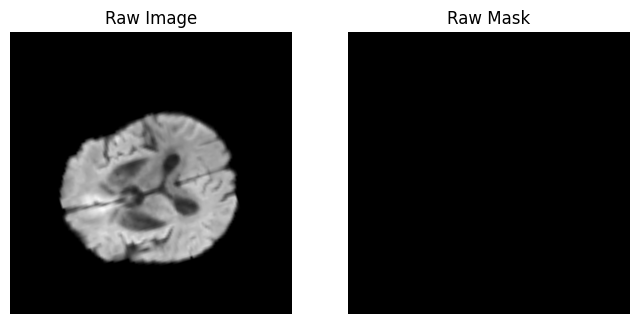

Sample 7 | Image shape: (512, 553, 70) | Mask shape: (512, 553, 70) | Mask values: tensor([0., 1.], dtype=torch.float64)


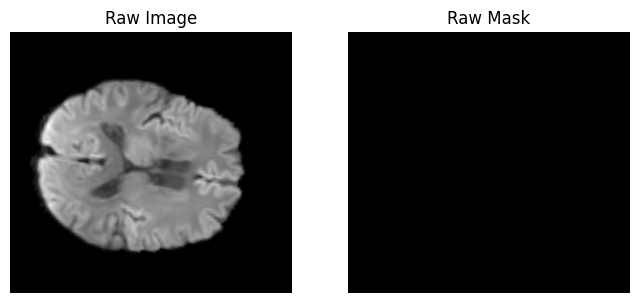


🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


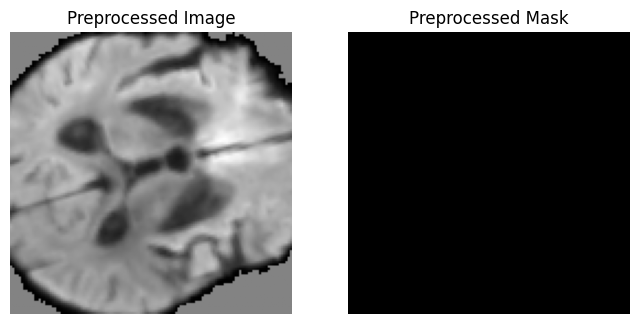

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


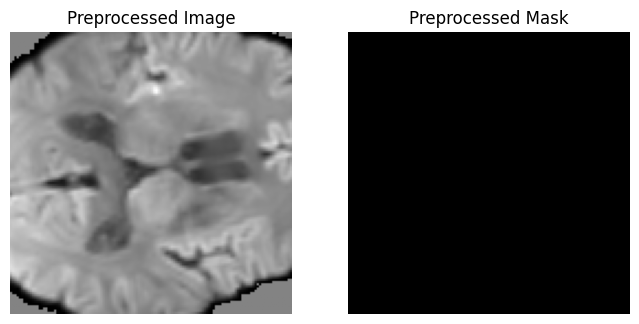


Client 0 dataset size: 50

Client 1
Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 1 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


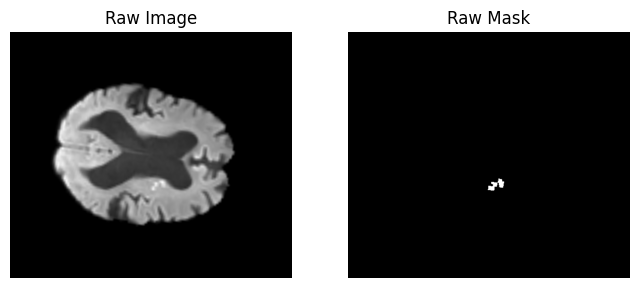

Sample 47 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


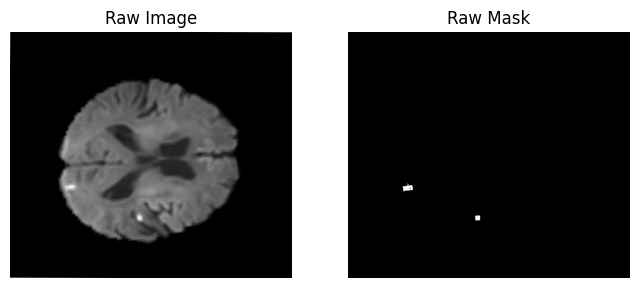


🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


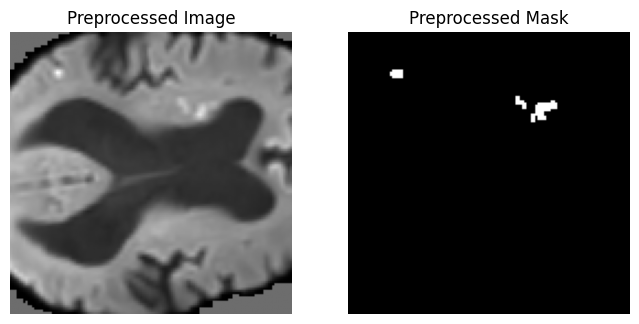

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


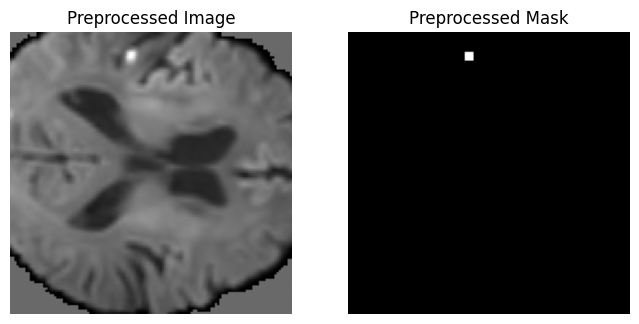


Client 1 dataset size: 50


In [16]:

original_root = "D:/F25-156/ISLES24 Split"
processed_root = "D:/F25-156/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(proc_dwi)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    print("\n🔵 RAW SAMPLES")
    for idx in sample_indices:

        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()

        print(
            f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
            f"Mask values: {torch.unique(torch.tensor(mask))}"
        )

        mid = img.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid], cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid], cmap="gray")
        plt.title("Raw Mask")
        plt.axis("off")
        plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [17]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [18]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [19]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## UNet

In [20]:
def create_model():
   model = UNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        num_res_units=2
    ).to(device)
   print(model)
   return model

**Client Class**

In [21]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=list_data_collate)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu   # FedProx coefficient
    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx proximal term 
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [22]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    # prevent device inconsistency- if client tensors are on different devices (CPU vs GPU), this can crash:
                    new_params[key] += client_params_list[i][key].to(param.device)

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)
    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [23]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
          (conv): Se

**Federated Training loop**

In [24]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.9167 | Dice: 0.0244 | IoU: 0.0124 | HD95: 86.2682


Client 0 | Epoch 2/20 | Loss: 0.9050 | Dice: 0.0252 | IoU: 0.0128 | HD95: 85.7800


Client 0 | Epoch 3/20 | Loss: 0.9020 | Dice: 0.0257 | IoU: 0.0130 | HD95: 85.7019


Client 0 | Epoch 4/20 | Loss: 0.9005 | Dice: 0.0266 | IoU: 0.0135 | HD95: 85.3616


Client 0 | Epoch 5/20 | Loss: 0.8991 | Dice: 0.0276 | IoU: 0.0140 | HD95: 85.5749


Client 0 | Epoch 6/20 | Loss: 0.8981 | Dice: 0.0284 | IoU: 0.0144 | HD95: 86.0220


Client 0 | Epoch 7/20 | Loss: 0.8972 | Dice: 0.0286 | IoU: 0.0145 | HD95: 86.1601


Client 0 | Epoch 8/20 | Loss: 0.8963 | Dice: 0.0303 | IoU: 0.0154 | HD95: 86.4434


Client 0 | Epoch 9/20 | Loss: 0.8954 | Dice: 0.0319 | IoU: 0.0162 | HD95: 86.4449


Client 0 | Epoch 10/20 | Loss: 0.8946 | Dice: 0.0336 | IoU: 0.0171 | HD95: 86.3727


Client 0 | Epoch 11/20 | Loss: 0.8937 | Dice: 0.0366 | IoU: 0.0186 | HD95: 86.2326


Client 0 | Epoch 12/20 | Loss: 0.8929 | Dice: 0.0394 | IoU: 0.0201 | HD95: 86.0958


Client 0 | Epoch 13/20 | Loss: 0.8920 | Dice: 0.0435 | IoU: 0.0222 | HD95: 85.9215


Client 0 | Epoch 14/20 | Loss: 0.8915 | Dice: 0.0478 | IoU: 0.0245 | HD95: 85.6253


Client 0 | Epoch 15/20 | Loss: 0.8903 | Dice: 0.0524 | IoU: 0.0269 | HD95: 85.5234


Client 0 | Epoch 16/20 | Loss: 0.8892 | Dice: 0.0600 | IoU: 0.0309 | HD95: 85.2125


Client 0 | Epoch 17/20 | Loss: 0.8884 | Dice: 0.0675 | IoU: 0.0349 | HD95: 84.9855


Client 0 | Epoch 18/20 | Loss: 0.8873 | Dice: 0.0748 | IoU: 0.0388 | HD95: 84.7489


Client 0 | Epoch 19/20 | Loss: 0.8864 | Dice: 0.0824 | IoU: 0.0430 | HD95: 84.5814


Clients Training:  50%|█████     | 1/2 [09:27<09:27, 567.07s/it]

Client 0 | Epoch 20/20 | Loss: 0.8852 | Dice: 0.0958 | IoU: 0.0503 | HD95: 84.0834
Client 0 | Loss=0.8951 | Dice=0.0958 | IoU=0.0503 | HD95=84.0834


Client 1 | Epoch 1/20 | Loss: 0.9236 | Dice: 0.0190 | IoU: 0.0096 | HD95: 82.4179


Client 1 | Epoch 2/20 | Loss: 0.9131 | Dice: 0.0197 | IoU: 0.0100 | HD95: 81.8873


Client 1 | Epoch 3/20 | Loss: 0.9094 | Dice: 0.0197 | IoU: 0.0099 | HD95: 81.1630


Client 1 | Epoch 4/20 | Loss: 0.9067 | Dice: 0.0196 | IoU: 0.0099 | HD95: 81.8545


Client 1 | Epoch 5/20 | Loss: 0.9040 | Dice: 0.0195 | IoU: 0.0099 | HD95: 82.6489


Client 1 | Epoch 6/20 | Loss: 0.8992 | Dice: 0.0201 | IoU: 0.0101 | HD95: 82.6067


Client 1 | Epoch 7/20 | Loss: 0.8863 | Dice: 0.0336 | IoU: 0.0171 | HD95: 82.4005


Client 1 | Epoch 8/20 | Loss: 0.8723 | Dice: 0.0549 | IoU: 0.0282 | HD95: 82.6647


Client 1 | Epoch 9/20 | Loss: 0.8599 | Dice: 0.0796 | IoU: 0.0414 | HD95: 82.8759


Client 1 | Epoch 10/20 | Loss: 0.8494 | Dice: 0.1017 | IoU: 0.0536 | HD95: 82.8985


Client 1 | Epoch 11/20 | Loss: 0.8399 | Dice: 0.1328 | IoU: 0.0711 | HD95: 83.3024


Client 1 | Epoch 12/20 | Loss: 0.8307 | Dice: 0.1529 | IoU: 0.0828 | HD95: 83.2983


Client 1 | Epoch 13/20 | Loss: 0.8225 | Dice: 0.1813 | IoU: 0.0997 | HD95: 82.6381


Client 1 | Epoch 14/20 | Loss: 0.8144 | Dice: 0.1847 | IoU: 0.1017 | HD95: 82.7338


Client 1 | Epoch 15/20 | Loss: 0.8069 | Dice: 0.2144 | IoU: 0.1201 | HD95: 82.4993


Client 1 | Epoch 16/20 | Loss: 0.8001 | Dice: 0.2272 | IoU: 0.1281 | HD95: 82.2995


Client 1 | Epoch 17/20 | Loss: 0.7937 | Dice: 0.2568 | IoU: 0.1473 | HD95: 82.9816


Client 1 | Epoch 18/20 | Loss: 0.7874 | Dice: 0.2669 | IoU: 0.1540 | HD95: 81.2723


Client 1 | Epoch 19/20 | Loss: 0.7816 | Dice: 0.2663 | IoU: 0.1536 | HD95: 80.1287


Client 1 Epochs: 100%|██████████| 20/20 [09:09<00:00, 27.49s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.7766 | Dice: 0.2745 | IoU: 0.1591 | HD95: 80.4325
Client 1 | Loss=0.8489 | Dice=0.2745 | IoU=0.1591 | HD95=80.4325


Best global model updated with Dice=0.0287
Global | Val Loss=0.8557 | Dice=0.0287 | IoU=0.0146 | HD95=75.0269
Checkpoint saved for round 1 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8246 | Dice: 0.1807 | IoU: 0.0993 | HD95: 86.7985


Client 0 | Epoch 2/20 | Loss: 0.8108 | Dice: 0.2467 | IoU: 0.1407 | HD95: 87.0231


Client 0 | Epoch 3/20 | Loss: 0.8006 | Dice: 0.2648 | IoU: 0.1526 | HD95: 86.0780


Client 0 | Epoch 4/20 | Loss: 0.7920 | Dice: 0.2937 | IoU: 0.1721 | HD95: 85.6941


Client 0 | Epoch 5/20 | Loss: 0.7830 | Dice: 0.2989 | IoU: 0.1757 | HD95: 84.8385


Client 0 | Epoch 6/20 | Loss: 0.7759 | Dice: 0.3270 | IoU: 0.1955 | HD95: 84.2009


Client 0 | Epoch 7/20 | Loss: 0.7686 | Dice: 0.3151 | IoU: 0.1870 | HD95: 82.7432


Client 0 | Epoch 8/20 | Loss: 0.7631 | Dice: 0.3333 | IoU: 0.2000 | HD95: 82.3807


Client 0 | Epoch 9/20 | Loss: 0.7558 | Dice: 0.3476 | IoU: 0.2104 | HD95: 79.6741


Client 0 | Epoch 10/20 | Loss: 0.7494 | Dice: 0.3564 | IoU: 0.2169 | HD95: 76.8341


Client 0 | Epoch 11/20 | Loss: 0.7465 | Dice: 0.3343 | IoU: 0.2007 | HD95: 75.1934


Client 0 | Epoch 12/20 | Loss: 0.7395 | Dice: 0.3584 | IoU: 0.2184 | HD95: 68.8350


Client 0 | Epoch 13/20 | Loss: 0.7346 | Dice: 0.3796 | IoU: 0.2343 | HD95: 66.1635


Client 0 | Epoch 14/20 | Loss: 0.7294 | Dice: 0.3702 | IoU: 0.2271 | HD95: 61.0007


Client 0 | Epoch 15/20 | Loss: 0.7232 | Dice: 0.3821 | IoU: 0.2362 | HD95: 62.6924


Client 0 | Epoch 16/20 | Loss: 0.7182 | Dice: 0.4003 | IoU: 0.2502 | HD95: 61.3171


Client 0 | Epoch 17/20 | Loss: 0.7160 | Dice: 0.3702 | IoU: 0.2272 | HD95: 61.2460


Client 0 | Epoch 18/20 | Loss: 0.7117 | Dice: 0.3840 | IoU: 0.2376 | HD95: 58.7091


Client 0 | Epoch 19/20 | Loss: 0.7056 | Dice: 0.3936 | IoU: 0.2450 | HD95: 57.3962


Clients Training:  50%|█████     | 1/2 [08:00<08:00, 480.61s/it]

Client 0 | Epoch 20/20 | Loss: 0.7033 | Dice: 0.3771 | IoU: 0.2323 | HD95: 62.9432
Client 0 | Loss=0.7526 | Dice=0.3771 | IoU=0.2323 | HD95=62.9432


Client 1 | Epoch 1/20 | Loss: 0.8325 | Dice: 0.1366 | IoU: 0.0733 | HD95: 81.7851


Client 1 | Epoch 2/20 | Loss: 0.8194 | Dice: 0.1947 | IoU: 0.1079 | HD95: 83.1096


Client 1 | Epoch 3/20 | Loss: 0.8111 | Dice: 0.2352 | IoU: 0.1333 | HD95: 83.3832


Client 1 | Epoch 4/20 | Loss: 0.8030 | Dice: 0.2561 | IoU: 0.1469 | HD95: 83.0776


Client 1 | Epoch 5/20 | Loss: 0.7958 | Dice: 0.2716 | IoU: 0.1571 | HD95: 82.5216


Client 1 | Epoch 6/20 | Loss: 0.7894 | Dice: 0.2900 | IoU: 0.1696 | HD95: 82.6732


Client 1 | Epoch 7/20 | Loss: 0.7832 | Dice: 0.3072 | IoU: 0.1815 | HD95: 81.3032


Client 1 | Epoch 8/20 | Loss: 0.7775 | Dice: 0.3047 | IoU: 0.1797 | HD95: 81.1905


Client 1 | Epoch 9/20 | Loss: 0.7708 | Dice: 0.3167 | IoU: 0.1882 | HD95: 79.3157


Client 1 | Epoch 10/20 | Loss: 0.7645 | Dice: 0.3360 | IoU: 0.2019 | HD95: 77.7080


Client 1 | Epoch 11/20 | Loss: 0.7588 | Dice: 0.3619 | IoU: 0.2209 | HD95: 75.3801


Client 1 | Epoch 12/20 | Loss: 0.7549 | Dice: 0.3349 | IoU: 0.2011 | HD95: 71.0691


Client 1 | Epoch 13/20 | Loss: 0.7487 | Dice: 0.3861 | IoU: 0.2392 | HD95: 66.7547


Client 1 | Epoch 14/20 | Loss: 0.7447 | Dice: 0.3572 | IoU: 0.2174 | HD95: 63.3250


Client 1 | Epoch 15/20 | Loss: 0.7392 | Dice: 0.3792 | IoU: 0.2339 | HD95: 59.2905


Client 1 | Epoch 16/20 | Loss: 0.7359 | Dice: 0.3742 | IoU: 0.2302 | HD95: 56.1151


Client 1 | Epoch 17/20 | Loss: 0.7308 | Dice: 0.3927 | IoU: 0.2444 | HD95: 52.6037


Client 1 | Epoch 18/20 | Loss: 0.7257 | Dice: 0.4013 | IoU: 0.2511 | HD95: 53.4455


Client 1 | Epoch 19/20 | Loss: 0.7225 | Dice: 0.4111 | IoU: 0.2587 | HD95: 54.1392


Client 1 Epochs: 100%|██████████| 20/20 [08:04<00:00, 24.22s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.7258 | Dice: 0.3542 | IoU: 0.2152 | HD95: 64.4400
Client 1 | Loss=0.7667 | Dice=0.3542 | IoU=0.2152 | HD95=64.4400


Best global model updated with Dice=0.3364
Global | Val Loss=0.6832 | Dice=0.3364 | IoU=0.2022 | HD95=48.9470
Checkpoint saved for round 2 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6953 | Dice: 0.3827 | IoU: 0.2366 | HD95: 57.5742


Client 0 | Epoch 2/20 | Loss: 0.6892 | Dice: 0.3866 | IoU: 0.2397 | HD95: 59.1748


Client 0 | Epoch 3/20 | Loss: 0.6842 | Dice: 0.4250 | IoU: 0.2699 | HD95: 56.3231


Client 0 | Epoch 4/20 | Loss: 0.6787 | Dice: 0.4374 | IoU: 0.2799 | HD95: 55.7965


Client 0 | Epoch 5/20 | Loss: 0.6739 | Dice: 0.4294 | IoU: 0.2734 | HD95: 55.3826


Client 0 | Epoch 6/20 | Loss: 0.6699 | Dice: 0.4553 | IoU: 0.2948 | HD95: 53.4684


Client 0 | Epoch 7/20 | Loss: 0.6654 | Dice: 0.4441 | IoU: 0.2854 | HD95: 51.0635


Client 0 | Epoch 8/20 | Loss: 0.6621 | Dice: 0.4150 | IoU: 0.2618 | HD95: 55.5950


Client 0 | Epoch 9/20 | Loss: 0.6586 | Dice: 0.4216 | IoU: 0.2671 | HD95: 58.8637


Client 0 | Epoch 10/20 | Loss: 0.6529 | Dice: 0.4330 | IoU: 0.2763 | HD95: 55.1216


Client 0 | Epoch 11/20 | Loss: 0.6556 | Dice: 0.4074 | IoU: 0.2558 | HD95: 59.7662


Client 0 | Epoch 12/20 | Loss: 0.6468 | Dice: 0.4350 | IoU: 0.2780 | HD95: 51.0702


Client 0 | Epoch 13/20 | Loss: 0.6403 | Dice: 0.4358 | IoU: 0.2786 | HD95: 56.2227


Client 0 | Epoch 14/20 | Loss: 0.6413 | Dice: 0.4294 | IoU: 0.2734 | HD95: 54.7971


Client 0 | Epoch 15/20 | Loss: 0.6337 | Dice: 0.4389 | IoU: 0.2812 | HD95: 51.7408


Client 0 | Epoch 16/20 | Loss: 0.6275 | Dice: 0.4459 | IoU: 0.2869 | HD95: 50.0445


Client 0 | Epoch 17/20 | Loss: 0.6219 | Dice: 0.4628 | IoU: 0.3010 | HD95: 47.3691


Client 0 | Epoch 18/20 | Loss: 0.6170 | Dice: 0.5050 | IoU: 0.3378 | HD95: 48.4904


Client 0 | Epoch 19/20 | Loss: 0.6168 | Dice: 0.4431 | IoU: 0.2846 | HD95: 51.9505


Clients Training:  50%|█████     | 1/2 [06:26<06:26, 386.96s/it]

Client 0 | Epoch 20/20 | Loss: 0.6176 | Dice: 0.4354 | IoU: 0.2783 | HD95: 54.7501
Client 0 | Loss=0.6524 | Dice=0.4354 | IoU=0.2783 | HD95=54.7501


Client 1 | Epoch 1/20 | Loss: 0.7076 | Dice: 0.3705 | IoU: 0.2274 | HD95: 57.6953


Client 1 | Epoch 2/20 | Loss: 0.7015 | Dice: 0.4187 | IoU: 0.2648 | HD95: 54.1497


Client 1 | Epoch 3/20 | Loss: 0.6982 | Dice: 0.4032 | IoU: 0.2525 | HD95: 54.5399


Client 1 | Epoch 4/20 | Loss: 0.6958 | Dice: 0.4068 | IoU: 0.2554 | HD95: 52.1864


Client 1 | Epoch 5/20 | Loss: 0.6899 | Dice: 0.4142 | IoU: 0.2612 | HD95: 54.1289


Client 1 | Epoch 6/20 | Loss: 0.6865 | Dice: 0.4234 | IoU: 0.2686 | HD95: 51.1812


Client 1 | Epoch 7/20 | Loss: 0.6827 | Dice: 0.4089 | IoU: 0.2570 | HD95: 53.5252


Client 1 | Epoch 8/20 | Loss: 0.6775 | Dice: 0.4514 | IoU: 0.2915 | HD95: 48.8140


Client 1 | Epoch 9/20 | Loss: 0.6767 | Dice: 0.4229 | IoU: 0.2681 | HD95: 48.2017


Client 1 | Epoch 10/20 | Loss: 0.6736 | Dice: 0.4139 | IoU: 0.2610 | HD95: 50.4852


Client 1 | Epoch 11/20 | Loss: 0.6667 | Dice: 0.4509 | IoU: 0.2911 | HD95: 47.7477


Client 1 | Epoch 12/20 | Loss: 0.6647 | Dice: 0.4343 | IoU: 0.2774 | HD95: 50.2062


Client 1 | Epoch 13/20 | Loss: 0.6618 | Dice: 0.4326 | IoU: 0.2760 | HD95: 51.3123


Client 1 | Epoch 14/20 | Loss: 0.6552 | Dice: 0.4567 | IoU: 0.2959 | HD95: 42.3843


Client 1 | Epoch 15/20 | Loss: 0.6504 | Dice: 0.4767 | IoU: 0.3129 | HD95: 40.0248


Client 1 | Epoch 16/20 | Loss: 0.6454 | Dice: 0.5025 | IoU: 0.3356 | HD95: 38.9696


Client 1 | Epoch 17/20 | Loss: 0.6441 | Dice: 0.4757 | IoU: 0.3121 | HD95: 41.7493


Client 1 | Epoch 18/20 | Loss: 0.6401 | Dice: 0.4790 | IoU: 0.3149 | HD95: 44.9086


Client 1 | Epoch 19/20 | Loss: 0.6347 | Dice: 0.5034 | IoU: 0.3364 | HD95: 45.9964


Client 1 Epochs: 100%|██████████| 20/20 [06:06<00:00, 18.32s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.6319 | Dice: 0.4799 | IoU: 0.3157 | HD95: 42.0677
Client 1 | Loss=0.6692 | Dice=0.4799 | IoU=0.3157 | HD95=42.0677


Best global model updated with Dice=0.4818
Global | Val Loss=0.5903 | Dice=0.4818 | IoU=0.3173 | HD95=41.9292
Checkpoint saved for round 3 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6026 | Dice: 0.4737 | IoU: 0.3104 | HD95: 48.4698


Client 0 | Epoch 2/20 | Loss: 0.5956 | Dice: 0.5293 | IoU: 0.3599 | HD95: 43.3667


Client 0 | Epoch 3/20 | Loss: 0.5914 | Dice: 0.4980 | IoU: 0.3315 | HD95: 41.0228


Client 0 | Epoch 4/20 | Loss: 0.5853 | Dice: 0.5442 | IoU: 0.3738 | HD95: 46.2847


Client 0 | Epoch 5/20 | Loss: 0.5811 | Dice: 0.5080 | IoU: 0.3405 | HD95: 41.5928


Client 0 | Epoch 6/20 | Loss: 0.5751 | Dice: 0.5315 | IoU: 0.3619 | HD95: 39.4250


Client 0 | Epoch 7/20 | Loss: 0.5710 | Dice: 0.5408 | IoU: 0.3706 | HD95: 40.1060


Client 0 | Epoch 8/20 | Loss: 0.5640 | Dice: 0.5690 | IoU: 0.3976 | HD95: 34.9085


Client 0 | Epoch 9/20 | Loss: 0.5621 | Dice: 0.5568 | IoU: 0.3858 | HD95: 40.1946


Client 0 | Epoch 10/20 | Loss: 0.5617 | Dice: 0.5395 | IoU: 0.3694 | HD95: 44.1997


Client 0 | Epoch 11/20 | Loss: 0.5698 | Dice: 0.4711 | IoU: 0.3081 | HD95: 47.2158


Client 0 | Epoch 12/20 | Loss: 0.5573 | Dice: 0.5193 | IoU: 0.3507 | HD95: 44.7202


Client 0 | Epoch 13/20 | Loss: 0.5475 | Dice: 0.5630 | IoU: 0.3918 | HD95: 40.5789


Client 0 | Epoch 14/20 | Loss: 0.5396 | Dice: 0.5828 | IoU: 0.4113 | HD95: 31.6697


Client 0 | Epoch 15/20 | Loss: 0.5347 | Dice: 0.5903 | IoU: 0.4187 | HD95: 36.3315


Client 0 | Epoch 16/20 | Loss: 0.5333 | Dice: 0.5717 | IoU: 0.4002 | HD95: 35.7937


Client 0 | Epoch 17/20 | Loss: 0.5273 | Dice: 0.5667 | IoU: 0.3954 | HD95: 38.4831


Client 0 | Epoch 18/20 | Loss: 0.5233 | Dice: 0.5897 | IoU: 0.4181 | HD95: 36.9886


Client 0 | Epoch 19/20 | Loss: 0.5212 | Dice: 0.5757 | IoU: 0.4042 | HD95: 36.7939


Clients Training:  50%|█████     | 1/2 [05:31<05:31, 331.59s/it]

Client 0 | Epoch 20/20 | Loss: 0.5120 | Dice: 0.6067 | IoU: 0.4355 | HD95: 34.1160
Client 0 | Loss=0.5578 | Dice=0.6067 | IoU=0.4355 | HD95=34.1160


Client 1 | Epoch 1/20 | Loss: 0.6223 | Dice: 0.4844 | IoU: 0.3196 | HD95: 42.9498


Client 1 | Epoch 2/20 | Loss: 0.6165 | Dice: 0.5180 | IoU: 0.3496 | HD95: 41.4145


Client 1 | Epoch 3/20 | Loss: 0.6101 | Dice: 0.5396 | IoU: 0.3695 | HD95: 33.2187


Client 1 | Epoch 4/20 | Loss: 0.6068 | Dice: 0.5289 | IoU: 0.3595 | HD95: 34.6221


Client 1 | Epoch 5/20 | Loss: 0.6088 | Dice: 0.4863 | IoU: 0.3213 | HD95: 42.7982


Client 1 | Epoch 6/20 | Loss: 0.6205 | Dice: 0.4175 | IoU: 0.2638 | HD95: 54.8336


Client 1 | Epoch 7/20 | Loss: 0.6068 | Dice: 0.4622 | IoU: 0.3005 | HD95: 44.5540


Client 1 | Epoch 8/20 | Loss: 0.5932 | Dice: 0.5408 | IoU: 0.3706 | HD95: 32.7237


Client 1 | Epoch 9/20 | Loss: 0.5850 | Dice: 0.5715 | IoU: 0.4001 | HD95: 31.5864


Client 1 | Epoch 10/20 | Loss: 0.5802 | Dice: 0.5723 | IoU: 0.4009 | HD95: 28.3477


Client 1 | Epoch 11/20 | Loss: 0.5774 | Dice: 0.5509 | IoU: 0.3801 | HD95: 35.0404


Client 1 | Epoch 12/20 | Loss: 0.5716 | Dice: 0.5648 | IoU: 0.3935 | HD95: 30.0459


Client 1 | Epoch 13/20 | Loss: 0.5647 | Dice: 0.5932 | IoU: 0.4216 | HD95: 29.3951


Client 1 | Epoch 14/20 | Loss: 0.5606 | Dice: 0.6025 | IoU: 0.4311 | HD95: 31.4577


Client 1 | Epoch 15/20 | Loss: 0.5561 | Dice: 0.5771 | IoU: 0.4056 | HD95: 29.7663


Client 1 | Epoch 16/20 | Loss: 0.5493 | Dice: 0.5925 | IoU: 0.4210 | HD95: 30.6469


Client 1 | Epoch 17/20 | Loss: 0.5446 | Dice: 0.5931 | IoU: 0.4215 | HD95: 25.3851


Client 1 | Epoch 18/20 | Loss: 0.5392 | Dice: 0.6319 | IoU: 0.4619 | HD95: 25.7498


Client 1 | Epoch 19/20 | Loss: 0.5355 | Dice: 0.6122 | IoU: 0.4411 | HD95: 27.0407


Client 1 Epochs: 100%|██████████| 20/20 [05:16<00:00, 15.84s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.5301 | Dice: 0.6135 | IoU: 0.4425 | HD95: 25.9766
Client 1 | Loss=0.5790 | Dice=0.6135 | IoU=0.4425 | HD95=25.9766


Best global model updated with Dice=0.5640
Global | Val Loss=0.4962 | Dice=0.5640 | IoU=0.3927 | HD95=33.3399
Checkpoint saved for round 4 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5023 | Dice: 0.5919 | IoU: 0.4204 | HD95: 29.9499


Client 0 | Epoch 2/20 | Loss: 0.4979 | Dice: 0.6061 | IoU: 0.4348 | HD95: 32.1929


Client 0 | Epoch 3/20 | Loss: 0.4927 | Dice: 0.6039 | IoU: 0.4326 | HD95: 33.7493


Client 0 | Epoch 4/20 | Loss: 0.4843 | Dice: 0.6213 | IoU: 0.4507 | HD95: 28.6149


Client 0 | Epoch 5/20 | Loss: 0.4767 | Dice: 0.6471 | IoU: 0.4783 | HD95: 28.0382


Client 0 | Epoch 6/20 | Loss: 0.4748 | Dice: 0.6222 | IoU: 0.4516 | HD95: 26.9213


Client 0 | Epoch 7/20 | Loss: 0.4643 | Dice: 0.6593 | IoU: 0.4918 | HD95: 22.5301


Client 0 | Epoch 8/20 | Loss: 0.4634 | Dice: 0.6496 | IoU: 0.4811 | HD95: 26.2330


Client 0 | Epoch 9/20 | Loss: 0.4597 | Dice: 0.6442 | IoU: 0.4751 | HD95: 27.2977


Client 0 | Epoch 10/20 | Loss: 0.4795 | Dice: 0.5767 | IoU: 0.4052 | HD95: 40.1594


Client 0 | Epoch 11/20 | Loss: 0.4563 | Dice: 0.6467 | IoU: 0.4779 | HD95: 24.4194


Client 0 | Epoch 12/20 | Loss: 0.4472 | Dice: 0.6625 | IoU: 0.4953 | HD95: 22.9120


Client 0 | Epoch 13/20 | Loss: 0.4401 | Dice: 0.6645 | IoU: 0.4976 | HD95: 22.8502


Client 0 | Epoch 14/20 | Loss: 0.4324 | Dice: 0.6842 | IoU: 0.5200 | HD95: 18.8466


Client 0 | Epoch 15/20 | Loss: 0.4315 | Dice: 0.6756 | IoU: 0.5101 | HD95: 21.4518


Client 0 | Epoch 16/20 | Loss: 0.4468 | Dice: 0.6085 | IoU: 0.4373 | HD95: 39.2104


Client 0 | Epoch 17/20 | Loss: 0.4358 | Dice: 0.6405 | IoU: 0.4711 | HD95: 24.9238


Client 0 | Epoch 18/20 | Loss: 0.4163 | Dice: 0.6990 | IoU: 0.5373 | HD95: 15.2567


Client 0 | Epoch 19/20 | Loss: 0.4192 | Dice: 0.6518 | IoU: 0.4835 | HD95: 26.7796


Clients Training:  50%|█████     | 1/2 [04:30<04:30, 270.72s/it]

Client 0 | Epoch 20/20 | Loss: 0.4116 | Dice: 0.6883 | IoU: 0.5247 | HD95: 23.5346
Client 0 | Loss=0.4566 | Dice=0.6883 | IoU=0.5247 | HD95=23.5346


Client 1 | Epoch 1/20 | Loss: 0.5237 | Dice: 0.5933 | IoU: 0.4218 | HD95: 24.6734


Client 1 | Epoch 2/20 | Loss: 0.5146 | Dice: 0.6320 | IoU: 0.4620 | HD95: 25.8226


Client 1 | Epoch 3/20 | Loss: 0.5090 | Dice: 0.6457 | IoU: 0.4767 | HD95: 20.4327


Client 1 | Epoch 4/20 | Loss: 0.5015 | Dice: 0.6563 | IoU: 0.4884 | HD95: 20.5838


Client 1 | Epoch 5/20 | Loss: 0.5033 | Dice: 0.6404 | IoU: 0.4711 | HD95: 26.8871


Client 1 | Epoch 6/20 | Loss: 0.4988 | Dice: 0.6358 | IoU: 0.4660 | HD95: 25.8482


Client 1 | Epoch 7/20 | Loss: 0.4874 | Dice: 0.6613 | IoU: 0.4940 | HD95: 18.6003


Client 1 | Epoch 8/20 | Loss: 0.4805 | Dice: 0.6674 | IoU: 0.5008 | HD95: 20.7793


Client 1 | Epoch 9/20 | Loss: 0.4766 | Dice: 0.6731 | IoU: 0.5073 | HD95: 21.5717


Client 1 | Epoch 10/20 | Loss: 0.4670 | Dice: 0.6877 | IoU: 0.5240 | HD95: 17.1055


Client 1 | Epoch 11/20 | Loss: 0.4595 | Dice: 0.6979 | IoU: 0.5360 | HD95: 18.3699


Client 1 | Epoch 12/20 | Loss: 0.4566 | Dice: 0.6896 | IoU: 0.5263 | HD95: 18.2989


Client 1 | Epoch 13/20 | Loss: 0.4511 | Dice: 0.6972 | IoU: 0.5351 | HD95: 19.4879


Client 1 | Epoch 14/20 | Loss: 0.4509 | Dice: 0.6788 | IoU: 0.5138 | HD95: 16.6841


Client 1 | Epoch 15/20 | Loss: 0.4410 | Dice: 0.7071 | IoU: 0.5470 | HD95: 16.5604


Client 1 | Epoch 16/20 | Loss: 0.4401 | Dice: 0.6891 | IoU: 0.5257 | HD95: 17.5706


Client 1 | Epoch 17/20 | Loss: 0.4334 | Dice: 0.7014 | IoU: 0.5401 | HD95: 16.6731


Client 1 | Epoch 18/20 | Loss: 0.4213 | Dice: 0.7239 | IoU: 0.5673 | HD95: 14.4968


Client 1 | Epoch 19/20 | Loss: 0.4243 | Dice: 0.7061 | IoU: 0.5457 | HD95: 14.3348


Client 1 Epochs: 100%|██████████| 20/20 [04:26<00:00, 13.31s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.4217 | Dice: 0.6852 | IoU: 0.5212 | HD95: 18.8935
Client 1 | Loss=0.4681 | Dice=0.6852 | IoU=0.5212 | HD95=18.8935


Best global model updated with Dice=0.6346
Global | Val Loss=0.4267 | Dice=0.6346 | IoU=0.4648 | HD95=23.6152
Checkpoint saved for round 5 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3982 | Dice: 0.6920 | IoU: 0.5291 | HD95: 20.1230


Client 0 | Epoch 2/20 | Loss: 0.3970 | Dice: 0.6760 | IoU: 0.5105 | HD95: 23.0961


Client 0 | Epoch 3/20 | Loss: 0.4125 | Dice: 0.6355 | IoU: 0.4657 | HD95: 28.3545


Client 0 | Epoch 4/20 | Loss: 0.3916 | Dice: 0.6890 | IoU: 0.5255 | HD95: 19.1969


Client 0 | Epoch 5/20 | Loss: 0.3806 | Dice: 0.7003 | IoU: 0.5388 | HD95: 21.7791


Client 0 | Epoch 6/20 | Loss: 0.3720 | Dice: 0.7275 | IoU: 0.5717 | HD95: 14.3879


Client 0 | Epoch 7/20 | Loss: 0.3713 | Dice: 0.7145 | IoU: 0.5558 | HD95: 15.5042


Client 0 | Epoch 8/20 | Loss: 0.3711 | Dice: 0.7107 | IoU: 0.5512 | HD95: 17.3096


Client 0 | Epoch 9/20 | Loss: 0.3900 | Dice: 0.6610 | IoU: 0.4936 | HD95: 27.8194


Client 0 | Epoch 10/20 | Loss: 0.3695 | Dice: 0.7084 | IoU: 0.5485 | HD95: 19.3770


Client 0 | Epoch 11/20 | Loss: 0.3586 | Dice: 0.7256 | IoU: 0.5693 | HD95: 15.0988


Client 0 | Epoch 12/20 | Loss: 0.3572 | Dice: 0.7056 | IoU: 0.5452 | HD95: 19.0901


Client 0 | Epoch 13/20 | Loss: 0.3531 | Dice: 0.7228 | IoU: 0.5660 | HD95: 17.0541


Client 0 | Epoch 14/20 | Loss: 0.3482 | Dice: 0.7304 | IoU: 0.5753 | HD95: 16.7065


Client 0 | Epoch 15/20 | Loss: 0.3519 | Dice: 0.7249 | IoU: 0.5685 | HD95: 17.5947


Client 0 | Epoch 16/20 | Loss: 0.3498 | Dice: 0.7178 | IoU: 0.5598 | HD95: 17.6899


Client 0 | Epoch 17/20 | Loss: 0.3353 | Dice: 0.7347 | IoU: 0.5807 | HD95: 14.6774


Client 0 | Epoch 18/20 | Loss: 0.3273 | Dice: 0.7528 | IoU: 0.6035 | HD95: 15.9559


Client 0 | Epoch 19/20 | Loss: 0.3170 | Dice: 0.7640 | IoU: 0.6182 | HD95: 12.0057


Clients Training:  50%|█████     | 1/2 [04:04<04:04, 244.46s/it]

Client 0 | Epoch 20/20 | Loss: 0.3147 | Dice: 0.7698 | IoU: 0.6258 | HD95: 11.4266
Client 0 | Loss=0.3633 | Dice=0.7698 | IoU=0.6258 | HD95=11.4266


Client 1 | Epoch 1/20 | Loss: 0.4174 | Dice: 0.6926 | IoU: 0.5298 | HD95: 20.7950


Client 1 | Epoch 2/20 | Loss: 0.4071 | Dice: 0.7148 | IoU: 0.5562 | HD95: 15.9769


Client 1 | Epoch 3/20 | Loss: 0.4064 | Dice: 0.7024 | IoU: 0.5413 | HD95: 17.6077


Client 1 | Epoch 4/20 | Loss: 0.4094 | Dice: 0.6925 | IoU: 0.5296 | HD95: 22.3601


Client 1 | Epoch 5/20 | Loss: 0.3909 | Dice: 0.7276 | IoU: 0.5718 | HD95: 14.8808


Client 1 | Epoch 6/20 | Loss: 0.3823 | Dice: 0.7370 | IoU: 0.5836 | HD95: 12.4976


Client 1 | Epoch 7/20 | Loss: 0.3766 | Dice: 0.7384 | IoU: 0.5853 | HD95: 12.8041


Client 1 | Epoch 8/20 | Loss: 0.3700 | Dice: 0.7536 | IoU: 0.6047 | HD95: 10.5685


Client 1 | Epoch 9/20 | Loss: 0.3623 | Dice: 0.7567 | IoU: 0.6087 | HD95: 8.9481


Client 1 | Epoch 10/20 | Loss: 0.3614 | Dice: 0.7552 | IoU: 0.6067 | HD95: 10.0395


Client 1 | Epoch 11/20 | Loss: 0.3561 | Dice: 0.7504 | IoU: 0.6005 | HD95: 9.6887


Client 1 | Epoch 12/20 | Loss: 0.3523 | Dice: 0.7565 | IoU: 0.6083 | HD95: 10.7061


Client 1 | Epoch 13/20 | Loss: 0.3449 | Dice: 0.7686 | IoU: 0.6242 | HD95: 9.3964


Client 1 | Epoch 14/20 | Loss: 0.3398 | Dice: 0.7643 | IoU: 0.6185 | HD95: 8.9635


Client 1 | Epoch 15/20 | Loss: 0.3424 | Dice: 0.7471 | IoU: 0.5963 | HD95: 11.7286


Client 1 | Epoch 16/20 | Loss: 0.3395 | Dice: 0.7613 | IoU: 0.6146 | HD95: 10.5377


Client 1 | Epoch 17/20 | Loss: 0.3314 | Dice: 0.7658 | IoU: 0.6205 | HD95: 8.8386


Client 1 | Epoch 18/20 | Loss: 0.3258 | Dice: 0.7700 | IoU: 0.6260 | HD95: 9.9980


Client 1 | Epoch 19/20 | Loss: 0.3251 | Dice: 0.7680 | IoU: 0.6234 | HD95: 8.1269


Client 1 Epochs: 100%|██████████| 20/20 [04:08<00:00, 12.42s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.3189 | Dice: 0.7765 | IoU: 0.6346 | HD95: 8.1810
Client 1 | Loss=0.3630 | Dice=0.7765 | IoU=0.6346 | HD95=8.1810


Best global model updated with Dice=0.6602
Global | Val Loss=0.3479 | Dice=0.6602 | IoU=0.4927 | HD95=21.6878
Checkpoint saved for round 6 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3173 | Dice: 0.7399 | IoU: 0.5872 | HD95: 18.6459


Client 0 | Epoch 2/20 | Loss: 0.3107 | Dice: 0.7437 | IoU: 0.5920 | HD95: 14.8536


Client 0 | Epoch 3/20 | Loss: 0.3021 | Dice: 0.7589 | IoU: 0.6115 | HD95: 9.9394


Client 0 | Epoch 4/20 | Loss: 0.3151 | Dice: 0.7236 | IoU: 0.5669 | HD95: 20.7099


Client 0 | Epoch 5/20 | Loss: 0.2993 | Dice: 0.7571 | IoU: 0.6092 | HD95: 15.3650


Client 0 | Epoch 6/20 | Loss: 0.3180 | Dice: 0.7017 | IoU: 0.5405 | HD95: 20.3295


Client 0 | Epoch 7/20 | Loss: 0.3130 | Dice: 0.7366 | IoU: 0.5831 | HD95: 14.0531


Client 0 | Epoch 8/20 | Loss: 0.2925 | Dice: 0.7623 | IoU: 0.6159 | HD95: 10.9685


Client 0 | Epoch 9/20 | Loss: 0.2827 | Dice: 0.7766 | IoU: 0.6349 | HD95: 9.9566


Client 0 | Epoch 10/20 | Loss: 0.2754 | Dice: 0.7886 | IoU: 0.6510 | HD95: 8.3759


Client 0 | Epoch 11/20 | Loss: 0.2731 | Dice: 0.7829 | IoU: 0.6432 | HD95: 10.2291


Client 0 | Epoch 12/20 | Loss: 0.2659 | Dice: 0.7943 | IoU: 0.6588 | HD95: 7.4761


Client 0 | Epoch 13/20 | Loss: 0.2620 | Dice: 0.7972 | IoU: 0.6628 | HD95: 9.6321


Client 0 | Epoch 14/20 | Loss: 0.2610 | Dice: 0.7969 | IoU: 0.6623 | HD95: 7.5260


Client 0 | Epoch 15/20 | Loss: 0.2562 | Dice: 0.8060 | IoU: 0.6750 | HD95: 7.5305


Client 0 | Epoch 16/20 | Loss: 0.2521 | Dice: 0.8035 | IoU: 0.6715 | HD95: 9.2834


Client 0 | Epoch 17/20 | Loss: 0.2481 | Dice: 0.8128 | IoU: 0.6846 | HD95: 7.2958


Client 0 | Epoch 18/20 | Loss: 0.2479 | Dice: 0.8066 | IoU: 0.6759 | HD95: 8.4064


Client 0 | Epoch 19/20 | Loss: 0.2497 | Dice: 0.8008 | IoU: 0.6678 | HD95: 9.1434


Clients Training:  50%|█████     | 1/2 [03:28<03:28, 208.23s/it]

Client 0 | Epoch 20/20 | Loss: 0.2546 | Dice: 0.7913 | IoU: 0.6547 | HD95: 8.8265
Client 0 | Loss=0.2798 | Dice=0.7913 | IoU=0.6547 | HD95=8.8265


Client 1 | Epoch 1/20 | Loss: 0.3218 | Dice: 0.7559 | IoU: 0.6076 | HD95: 14.1234


Client 1 | Epoch 2/20 | Loss: 0.3312 | Dice: 0.7351 | IoU: 0.5812 | HD95: 18.0918


Client 1 | Epoch 3/20 | Loss: 0.3169 | Dice: 0.7589 | IoU: 0.6115 | HD95: 11.7770


Client 1 | Epoch 4/20 | Loss: 0.3106 | Dice: 0.7626 | IoU: 0.6162 | HD95: 8.9300


Client 1 | Epoch 5/20 | Loss: 0.3052 | Dice: 0.7709 | IoU: 0.6272 | HD95: 8.6391


Client 1 | Epoch 6/20 | Loss: 0.2945 | Dice: 0.7831 | IoU: 0.6435 | HD95: 8.2040


Client 1 | Epoch 7/20 | Loss: 0.2884 | Dice: 0.7921 | IoU: 0.6558 | HD95: 7.4856


Client 1 | Epoch 8/20 | Loss: 0.2837 | Dice: 0.7913 | IoU: 0.6546 | HD95: 7.1881


Client 1 | Epoch 9/20 | Loss: 0.2805 | Dice: 0.7990 | IoU: 0.6653 | HD95: 7.5254


Client 1 | Epoch 10/20 | Loss: 0.2785 | Dice: 0.7936 | IoU: 0.6578 | HD95: 7.1230


Client 1 | Epoch 11/20 | Loss: 0.2748 | Dice: 0.7993 | IoU: 0.6657 | HD95: 9.4262


Client 1 | Epoch 12/20 | Loss: 0.2722 | Dice: 0.7999 | IoU: 0.6665 | HD95: 8.0366


Client 1 | Epoch 13/20 | Loss: 0.2707 | Dice: 0.8035 | IoU: 0.6715 | HD95: 7.5092


Client 1 | Epoch 14/20 | Loss: 0.2730 | Dice: 0.7909 | IoU: 0.6541 | HD95: 7.2612


Client 1 | Epoch 15/20 | Loss: 0.2684 | Dice: 0.7957 | IoU: 0.6607 | HD95: 7.6028


Client 1 | Epoch 16/20 | Loss: 0.2638 | Dice: 0.8019 | IoU: 0.6694 | HD95: 7.5262


Client 1 | Epoch 17/20 | Loss: 0.2567 | Dice: 0.8125 | IoU: 0.6842 | HD95: 7.3970


Client 1 | Epoch 18/20 | Loss: 0.2591 | Dice: 0.8023 | IoU: 0.6698 | HD95: 7.4290


Client 1 | Epoch 19/20 | Loss: 0.2562 | Dice: 0.8055 | IoU: 0.6744 | HD95: 7.5387


Client 1 Epochs: 100%|██████████| 20/20 [03:07<00:00,  9.39s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2514 | Dice: 0.8103 | IoU: 0.6812 | HD95: 7.0338
Client 1 | Loss=0.2829 | Dice=0.8103 | IoU=0.6812 | HD95=7.0338


Global | Val Loss=0.3176 | Dice=0.6389 | IoU=0.4694 | HD95=23.1932
Checkpoint saved for round 7 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round7.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 8 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3054 | Dice: 0.6910 | IoU: 0.5279 | HD95: 23.5262


Client 0 | Epoch 2/20 | Loss: 0.3022 | Dice: 0.6912 | IoU: 0.5282 | HD95: 18.5676


Client 0 | Epoch 3/20 | Loss: 0.2640 | Dice: 0.7677 | IoU: 0.6230 | HD95: 15.8008


Client 0 | Epoch 4/20 | Loss: 0.2558 | Dice: 0.7785 | IoU: 0.6373 | HD95: 10.9635


Client 0 | Epoch 5/20 | Loss: 0.2399 | Dice: 0.7970 | IoU: 0.6626 | HD95: 8.7940


Client 0 | Epoch 6/20 | Loss: 0.2330 | Dice: 0.8117 | IoU: 0.6831 | HD95: 6.3185


Client 0 | Epoch 7/20 | Loss: 0.2287 | Dice: 0.8198 | IoU: 0.6946 | HD95: 6.3984


Client 0 | Epoch 8/20 | Loss: 0.2285 | Dice: 0.8113 | IoU: 0.6825 | HD95: 6.2775


Client 0 | Epoch 9/20 | Loss: 0.2214 | Dice: 0.8253 | IoU: 0.7026 | HD95: 6.2827


Client 0 | Epoch 10/20 | Loss: 0.2214 | Dice: 0.8172 | IoU: 0.6908 | HD95: 9.1018


Client 0 | Epoch 11/20 | Loss: 0.2196 | Dice: 0.8252 | IoU: 0.7025 | HD95: 6.2891


Client 0 | Epoch 12/20 | Loss: 0.2158 | Dice: 0.8222 | IoU: 0.6981 | HD95: 6.2271


Client 0 | Epoch 13/20 | Loss: 0.2120 | Dice: 0.8273 | IoU: 0.7055 | HD95: 6.1489


Client 0 | Epoch 14/20 | Loss: 0.2087 | Dice: 0.8334 | IoU: 0.7143 | HD95: 5.9559


Client 0 | Epoch 15/20 | Loss: 0.2087 | Dice: 0.8277 | IoU: 0.7060 | HD95: 5.9923


Client 0 | Epoch 16/20 | Loss: 0.2070 | Dice: 0.8260 | IoU: 0.7036 | HD95: 5.9869


Client 0 | Epoch 17/20 | Loss: 0.2064 | Dice: 0.8303 | IoU: 0.7099 | HD95: 6.8891


Client 0 | Epoch 18/20 | Loss: 0.2051 | Dice: 0.8319 | IoU: 0.7123 | HD95: 8.8724


Client 0 | Epoch 19/20 | Loss: 0.2061 | Dice: 0.8270 | IoU: 0.7050 | HD95: 7.9988


Clients Training:  50%|█████     | 1/2 [02:59<02:59, 179.95s/it]

Client 0 | Epoch 20/20 | Loss: 0.2020 | Dice: 0.8316 | IoU: 0.7118 | HD95: 5.9113
Client 0 | Loss=0.2296 | Dice=0.8316 | IoU=0.7118 | HD95=5.9113


Client 1 | Epoch 1/20 | Loss: 0.2883 | Dice: 0.7375 | IoU: 0.5842 | HD95: 18.9206


Client 1 | Epoch 2/20 | Loss: 0.3043 | Dice: 0.7064 | IoU: 0.5461 | HD95: 22.6123


Client 1 | Epoch 3/20 | Loss: 0.2710 | Dice: 0.7720 | IoU: 0.6287 | HD95: 10.4036


Client 1 | Epoch 4/20 | Loss: 0.2591 | Dice: 0.7851 | IoU: 0.6462 | HD95: 10.2222


Client 1 | Epoch 5/20 | Loss: 0.2519 | Dice: 0.7994 | IoU: 0.6659 | HD95: 8.2726


Client 1 | Epoch 6/20 | Loss: 0.2398 | Dice: 0.8096 | IoU: 0.6801 | HD95: 7.3705


Client 1 | Epoch 7/20 | Loss: 0.2328 | Dice: 0.8207 | IoU: 0.6960 | HD95: 7.0478


Client 1 | Epoch 8/20 | Loss: 0.2277 | Dice: 0.8251 | IoU: 0.7022 | HD95: 7.2320


Client 1 | Epoch 9/20 | Loss: 0.2249 | Dice: 0.8279 | IoU: 0.7064 | HD95: 6.8286


Client 1 | Epoch 10/20 | Loss: 0.2230 | Dice: 0.8251 | IoU: 0.7023 | HD95: 7.0930


Client 1 | Epoch 11/20 | Loss: 0.2222 | Dice: 0.8239 | IoU: 0.7005 | HD95: 7.2145


Client 1 | Epoch 12/20 | Loss: 0.2219 | Dice: 0.8253 | IoU: 0.7025 | HD95: 7.1355


Client 1 | Epoch 13/20 | Loss: 0.2181 | Dice: 0.8281 | IoU: 0.7067 | HD95: 7.1239


Client 1 | Epoch 14/20 | Loss: 0.2133 | Dice: 0.8356 | IoU: 0.7176 | HD95: 6.9648


Client 1 | Epoch 15/20 | Loss: 0.2132 | Dice: 0.8311 | IoU: 0.7111 | HD95: 7.0933


Client 1 | Epoch 16/20 | Loss: 0.2153 | Dice: 0.8276 | IoU: 0.7058 | HD95: 7.0529


Client 1 | Epoch 17/20 | Loss: 0.2136 | Dice: 0.8290 | IoU: 0.7079 | HD95: 8.8176


Client 1 | Epoch 18/20 | Loss: 0.2174 | Dice: 0.8215 | IoU: 0.6971 | HD95: 7.3732


Client 1 | Epoch 19/20 | Loss: 0.2102 | Dice: 0.8319 | IoU: 0.7121 | HD95: 6.7702


Client 1 Epochs: 100%|██████████| 20/20 [03:06<00:00,  9.32s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2059 | Dice: 0.8355 | IoU: 0.7174 | HD95: 7.0432
Client 1 | Loss=0.2337 | Dice=0.8355 | IoU=0.7174 | HD95=7.0432


Global | Val Loss=0.2986 | Dice=0.6364 | IoU=0.4667 | HD95=21.7293
Checkpoint saved for round 8 at D:/F25-156/UNet/Federated_UNet_checkpoints\federated_round8.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 8 (no Dice improvement for 2 rounds)


**Graph**

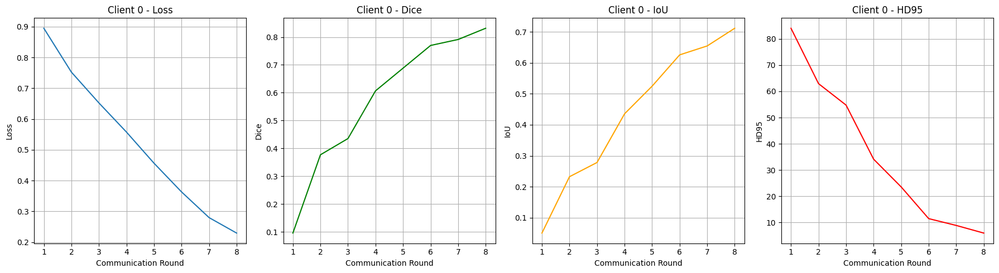

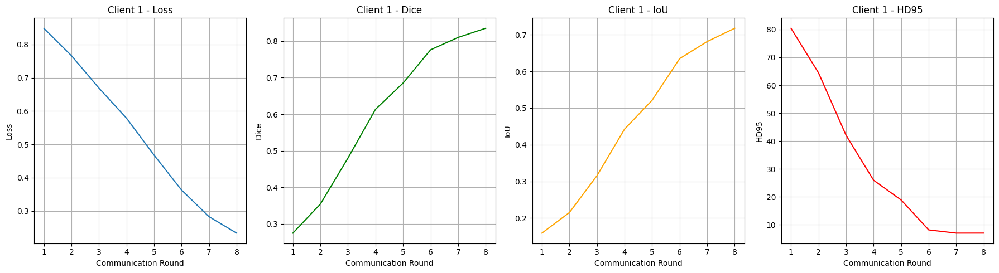

In [25]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

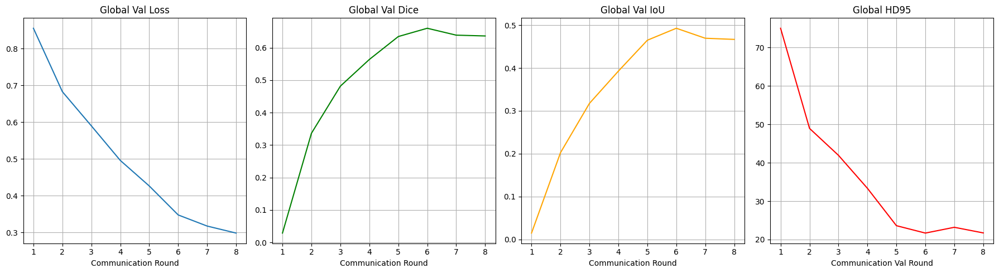

In [26]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [27]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_17592\837846673.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth

Test samples: 29
UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
   

Testing: 100%|██████████| 29/29 [00:05<00:00,  4.90it/s, Dice=0.6421, IoU=0.4729, HD95=27.3342]


Test Set Metrics:
Dice: 0.6421
IoU: 0.4729
HD95: 27.3342


**Visualize**

29


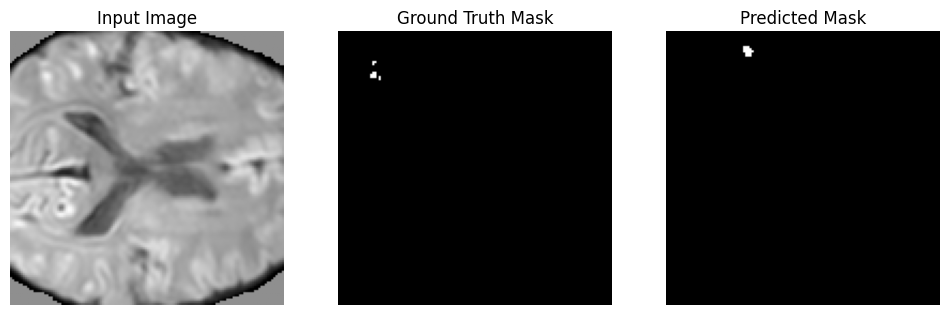

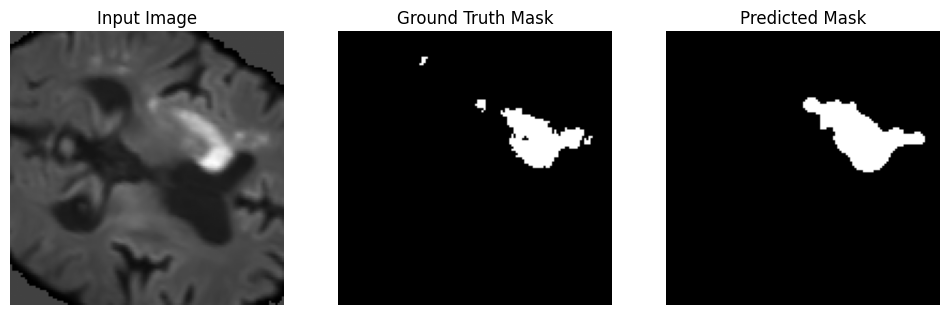

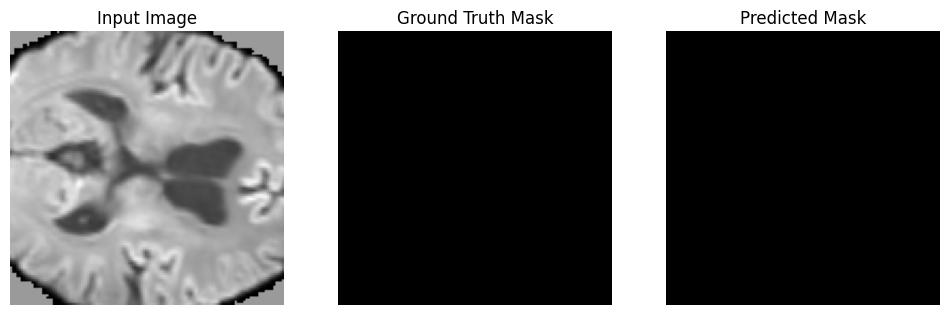

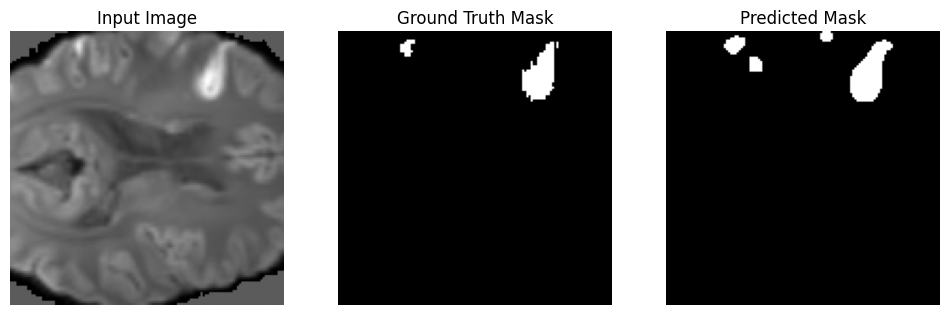

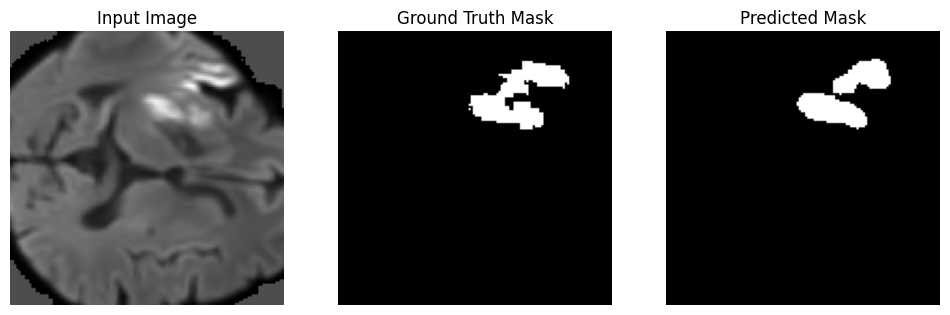

...

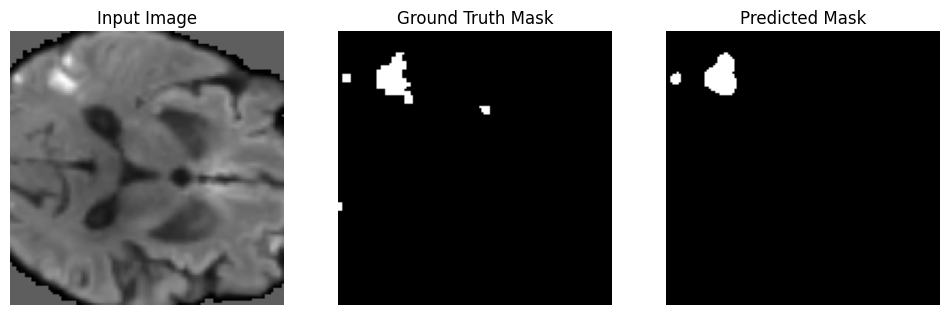

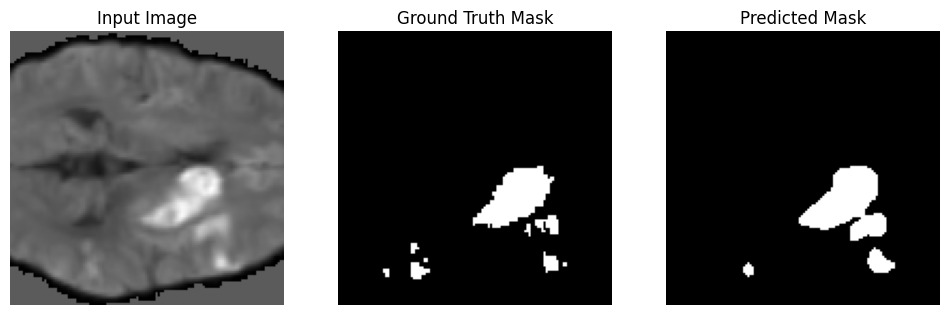

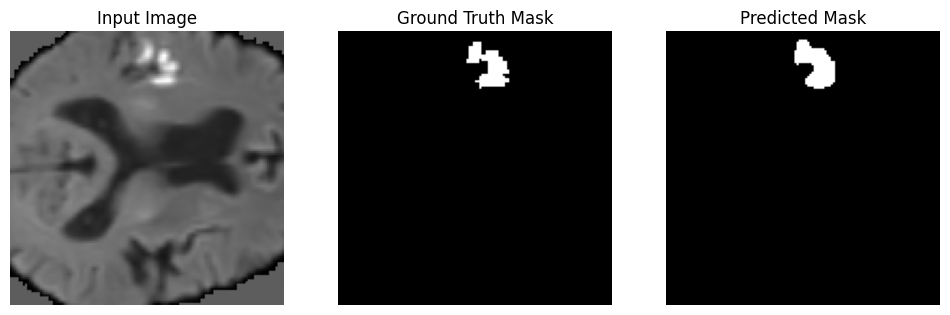

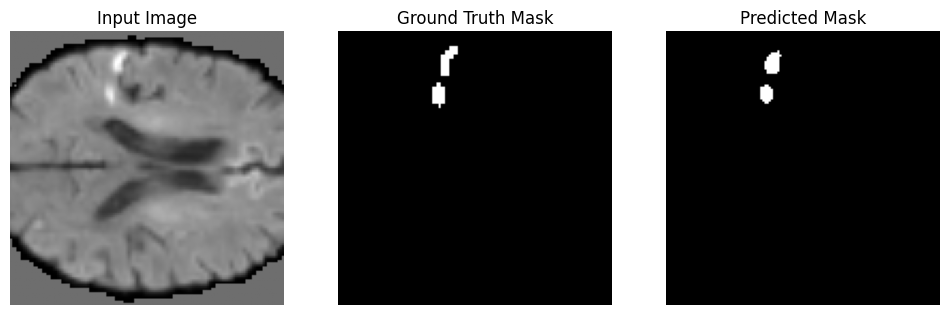

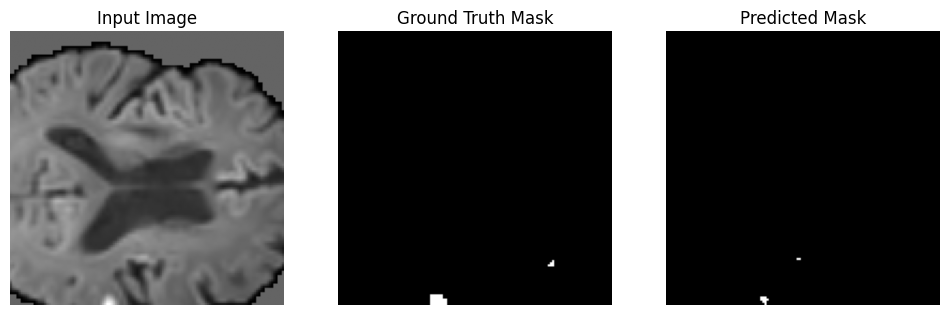

In [28]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()